In [1]:
import numpy as np
import cv2
import os

import matplotlib.pyplot as plt
from matplotlib.patches import Circle
from matplotlib.lines import Line2D

from data_utils.utils import load_ann, paths

In [2]:
val_dataset_path = paths["val_img"]
val_ann_path = paths["val_ann"]

pred_data_path = "data/input/val_predictions/results-depotr-val_ann-re50-ep100-192x256.json"
output_path = "data/output/visualization"

keypoint_connections = [[16, 14],[14, 12],[17, 15],[15, 13],[12, 13],[6, 12],[7, 13],
                        [6, 7],[6, 8],[7, 9],[8, 10],[9, 11],[2, 3],[1, 2],[1, 3],[2, 4],[3, 5],[4, 6],[5, 7]]

colors = ['red', 'orangered', 'sienna', 'orange', 'gold', 'yellow', 'limegreen', 'green', 'turquoise', 'teal', 'steelblue', 'navy', 'slateblue','indigo', 'violet','purple','hotpink']

In [3]:
def get_err(pred_aid_to_joints, min_kp=0, max_kp=17, min_area=14000):
    err_d = {}
    idx = set(pred_aid_to_joints.keys())

    for i in idx:
        if aid_to_ann[i]['num_keypoints'] > min_kp and aid_to_ann[i]['num_keypoints']  < max_kp and aid_to_ann[i]['area'] > min_area:
            xy, v = val_aid_to_joints[i]
            xy2 = pred_aid_to_joints[i]
            vv = np.transpose(np.array([v,v]))
            xy2 = xy2 * vv

            err =  (np.linalg.norm( np.array(xy) - np.array(xy2), 2 ) /  aid_to_ann[i]['num_keypoints'])
            err_d[i] = err

    return dict(sorted(err_d.items(), key=lambda item: item[1]))

def get_img_err(err_d):
    iid_to_err = {}
    iid_to_aid = {}

    for aid in err_d:
        iid = aid_to_ann[aid]['image_id']
        if iid in iid_to_err:
            iid_to_err[iid] += err_d[aid]
            iid_to_aid[iid].append(aid)
        else:
            iid_to_err[iid] = err_d[aid]
            iid_to_aid[iid] = [aid]

    return dict(sorted(iid_to_err.items(), key=lambda item: item[1]))

def convert_positions(aid):
    x = aid_to_ann[aid]['keypoints'][0::3]
    y = aid_to_ann[aid]['keypoints'][1::3]
    v = aid_to_ann[aid]['keypoints'][2::3]
    xy = list(zip(x,y))

    return np.array(xy), (np.array(v) > 0) * 1

In [4]:
val_ann = load_ann(val_ann_path)
pred_ann = load_ann(pred_data_path)

iid_to_aid = {}
aid_to_ann = {}
val_aid_to_joints = {}

for i in val_ann['images']:
    iid_to_aid[i['id']] = []
for a in val_ann['annotations']:
    aid_to_ann[a['id']] = a
for a in val_ann['annotations']:
    val_aid_to_joints[a['id']] = convert_positions(a['id'])
    iid_to_aid[a['image_id']].append( a["id"])

pred_aid_to_joints = {}
for a in pred_ann:
    pred_aid_to_joints[a['id']] = np.array(a['joints'])

In [5]:
def load(iid):
    iid = aid_to_ann[iid]['image_id']
    name = '%012d.jpg' % iid

    img_path = os.path.join(val_dataset_path, name)
    return cv2.imread(img_path)[:,:,::-1]

def load2(iid):
    name = '%012d.jpg' % iid

    img_path = os.path.join(val_dataset_path, name)
    return cv2.imread(img_path)[:,:,::-1]

def add_patches(ann, ax):
    r = 7  #5
    lw = 2.5 #2
    for k, j in enumerate(ann):
        if j[0] > 0 and j[1] > 0:
            ax.add_patch(Circle((j[0], j[1]),
                                 color = colors[k],
                                 radius = r))

    for i,k in enumerate(keypoint_connections):
        kp_id1 = k[0]-1
        kp_id2 = k[1]-1
        kp1_x = ann[kp_id1][0]
        kp1_y = ann[kp_id1][1]
        kp2_x = ann[kp_id2][0]
        kp2_y = ann[kp_id2][1]
        if kp1_x > 0 and kp2_x > 0:
            x = [kp1_x, kp2_x]
            y = [kp1_y, kp2_y]
            ax.add_line(Line2D(x, y, lw=lw, color=colors[kp_id1], alpha=0.75))
    return ax

def display(iid, size=(16,9), path=""):
    img =  load(iid)

    val, vis = val_aid_to_joints[iid]
    vis2 = np.transpose(np.array([vis,vis]))

    prd = pred_aid_to_joints[iid]
    prd = prd*vis2
    fix, axs = plt.subplots(1,2, figsize=size)

    ax = axs[0]
    ax.imshow(img)
    ax = add_patches(val, ax)
    ax.set_title(f'val - iid: {iid}')

    ax = axs[1]
    ax.imshow(img)
    ax = add_patches(prd, ax)
    ax.set_title(f'pred - err: {err_d[iid]:.3f}')

    if path:
        plt.savefig(path, bbox_inches='tight')
    else:
        plt.show()


def display_all(iid, size=(16,9), path=""):
    img =  load2(iid)

    fix, ax = plt.subplots(1,2, figsize=size)
    ax[0].imshow(img)
    ax[1].imshow(img)

    for aid in iid_to_aid[iid]:
        val, vis = val_aid_to_joints[aid]
        vis2 = np.transpose(np.array([vis,vis]))

        ax[0] = add_patches(val, ax[0])
        ax[0].set_title(f'val - iid: {iid}')

        if aid in pred_aid_to_joints:
            prd = pred_aid_to_joints[aid]
            prd = prd*vis2

            ax[1] = add_patches(prd, ax[1])
            ax[1].set_title(f'pred - err: {iid_to_err[iid]:.3f}')

    if path:
        plt.savefig(path, bbox_inches='tight')
    else:
        plt.show()

def display_in_row(iids, path="", fontsize=14, gt=True, label='Detected'):
    widths = []
    heights = []
    images = []
    for i, iid in enumerate(iids):
        img =  load2(iid)
        images.append(img)
        heights.append(img.shape[0])
        widths.append(img.shape[1])

    sum = np.sum(widths)
    proportions = [(w/sum) for w in widths]
    px2inch = 0.0104166667

    cols = len(iids)
    rows = 1
    if (gt):
        rows = 2

    fig, axs = plt.subplots(rows, cols, figsize=([sum*px2inch, rows*4.8]), gridspec_kw={'width_ratios': proportions} ) # sum*px2inch cols*6.4 #,

    dt_axs = axs
    if (gt):
        gt_axs = axs[0,:]
        dt_axs = axs[1,:]

    for i, iid in enumerate(iids):
        img =  load2(iid)

        if (gt):
            gt_axs[i].imshow(img)
        dt_axs[i].imshow(img)

        if (gt):
            plt.setp(gt_axs[i].get_xticklabels(), visible=False)
            plt.setp(gt_axs[i].get_yticklabels(), visible=False)
            gt_axs[i].tick_params(axis='both', which='both', length=0)

        plt.setp(dt_axs[i].get_xticklabels(), visible=False)
        plt.setp(dt_axs[i].get_yticklabels(), visible=False)
        dt_axs[i].tick_params(axis='both', which='both', length=0)

        if i == 0:
            if (gt):
                gt_axs[i].set_ylabel('Ground Truth', fontsize=fontsize)
            dt_axs[i].set_ylabel(label, fontsize=fontsize)

        aids = iid_to_aid[iid]
        for aid in aids:
            val, vis = val_aid_to_joints[aid]
            vis2 = np.transpose(np.array([vis,vis]))
            if (gt):
                gt_axs[i] = add_patches(val, gt_axs[i])

            if aid in pred_aid_to_joints:
                prd = pred_aid_to_joints[aid]
                prd = prd*vis2
                dt_axs[i] = add_patches(prd, dt_axs[i])

    plt.tight_layout()
    if path:
        fig.savefig(path, bbox_inches='tight')

def display_images_by_err(n_img, min_people, max_err):
    if max_err:
        max_iid = len(iid_to_err)-1
    else:
        max_iid = 0
    num = 0

    while num < n_img or max_iid == 0:
        k = list(iid_to_err.keys())[max_iid]
        if isinstance(min_people, list):
            if len(iid_to_aid[k]) > min_people[0] and len(iid_to_aid[k]) < min_people[1]:
                display_all(k)
                num += 1
        else:
            if len(iid_to_aid[k]) > min_people:
                display_all(k)
                num += 1
        if max_err:
            max_iid -= 1
        else:
            max_iid += 1

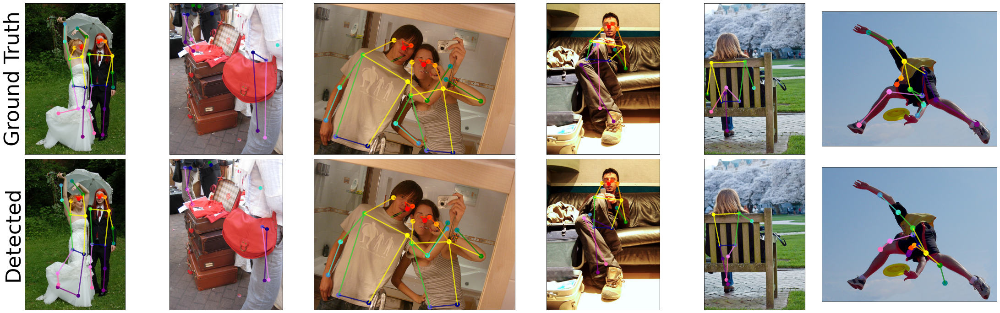

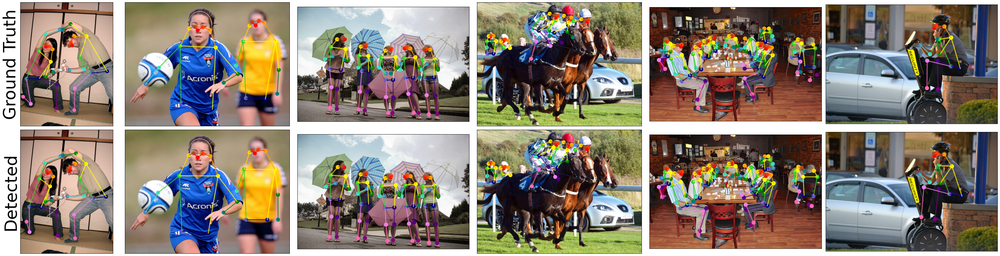

In [6]:
bad = [476514, 329041, 164602, 560911, 349184, 128654]
good = [234607, 22935, 281759, 507975, 31296,  383289]

display_in_row(bad, os.path.join(output_path, "incorrect_predictions.pdf"), fontsize=45)
display_in_row(good, os.path.join(output_path, "correct_predictions.pdf"), fontsize=45)

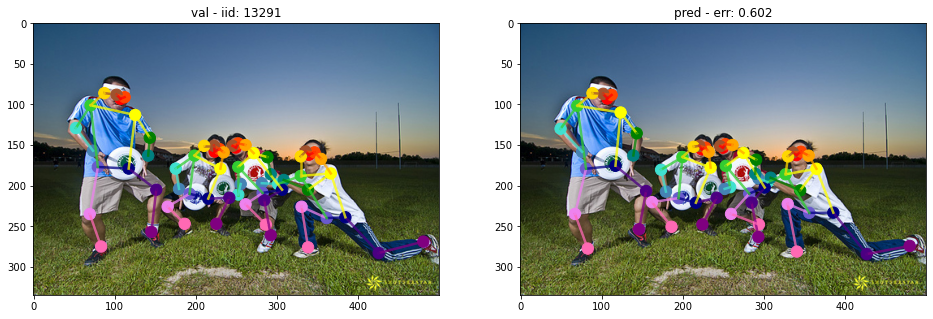

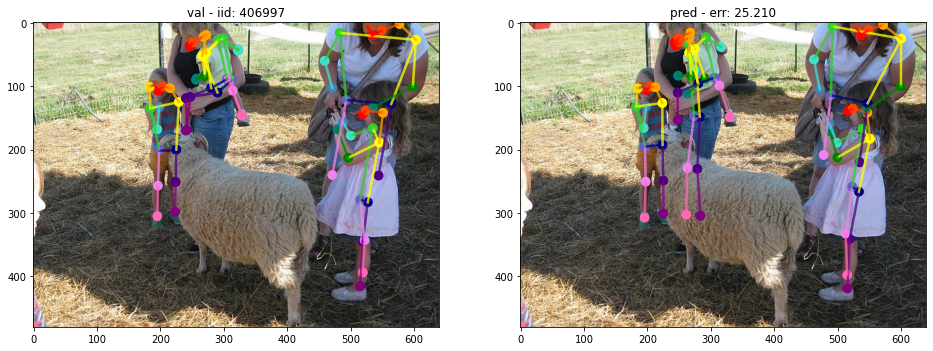

In [7]:
err_d = get_err(pred_aid_to_joints, min_kp=6, max_kp=17, min_area=10000)
iid_to_err = get_img_err(err_d)

display_images_by_err(1, 3, False)
display_images_by_err(1, [4,6], True)

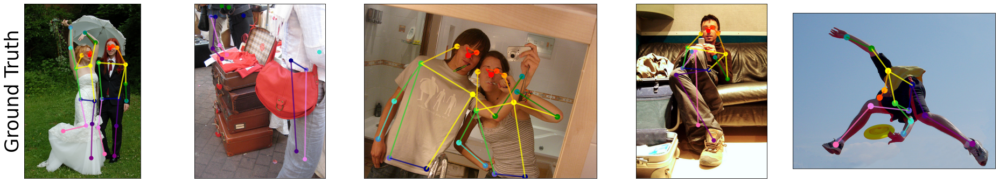

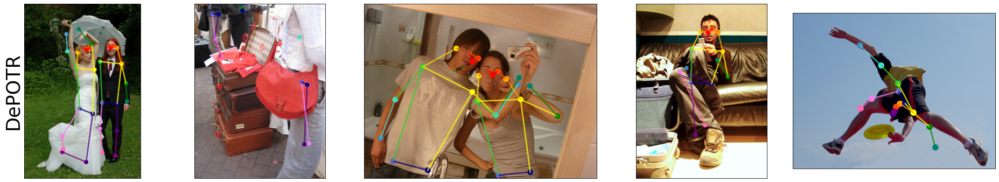

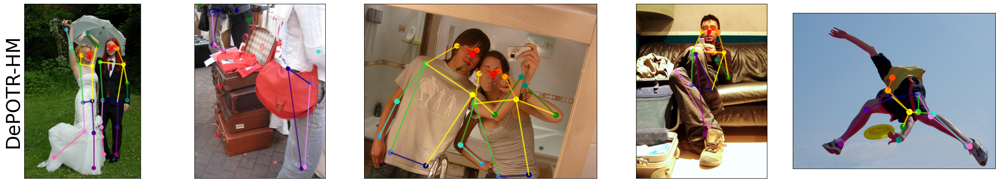

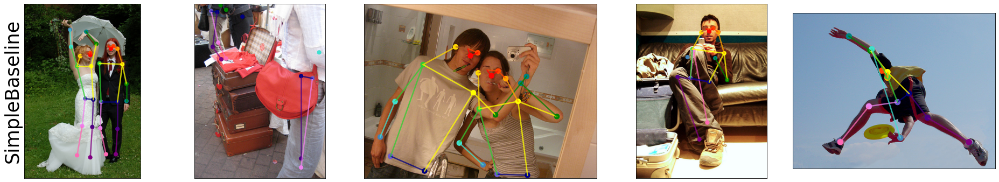

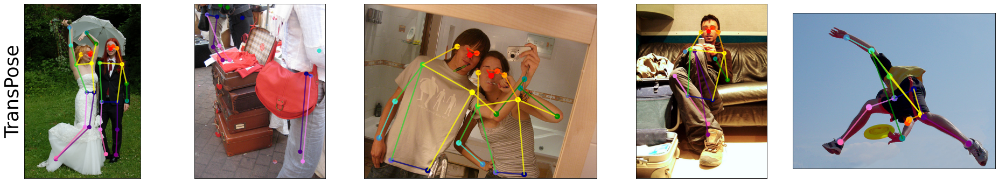

In [8]:
pred_data_path_depotr = "data/input/val_predictions/results-depotr-val_ann-re50-ep100-192x256.json"
pred_data_path_depotrhm = "data/input/val_predictions/results-depotr_hm-val_ann-re152-ep50-288x384.json"
pred_data_path_baseline = "data/input/val_predictions/results-baseline-val_ann-re152-288x384.json"
pred_data_path_transpose = "data/input/val_predictions/results-transpose-val_ann-hrnet-192x256.json"
output_path = "data/output/visualization/models_comparison"

mix = [476514, 329041, 164602, 560911, 128654]
#mix = [476514, 872, 252776, 288862, 90284]

val_to_pred_aid_to_joints = {}
for k in val_aid_to_joints:
    val_to_pred_aid_to_joints[k] = val_aid_to_joints[k][0]
pred_aid_to_joints = val_to_pred_aid_to_joints
display_in_row(mix, os.path.join(output_path, "gt.pdf"), fontsize=35, gt=False, label='Ground Truth')

pred_ann = load_ann(pred_data_path_depotr)
pred_aid_to_joints = {}
for a in pred_ann:
    pred_aid_to_joints[a['id']] = np.array(a['joints'])
display_in_row(mix, os.path.join(output_path, "dp.pdf"), fontsize=35, gt=False, label='DePOTR')

pred_ann = load_ann(pred_data_path_depotrhm)
pred_aid_to_joints = {}
for a in pred_ann:
    pred_aid_to_joints[a['id']] = np.array(a['joints'])
display_in_row(mix, os.path.join(output_path, "dphm.pdf"), fontsize=35, gt=False, label='DePOTR-HM')

pred_ann = load_ann(pred_data_path_baseline)
pred_aid_to_joints = {}
for a in pred_ann:
    pred_aid_to_joints[a['id']] = np.array(a['joints'])
display_in_row(mix, os.path.join(output_path, "sb.pdf"), fontsize=35, gt=False, label='SimpleBaseline')

pred_ann = load_ann(pred_data_path_transpose)
pred_aid_to_joints = {}
for a in pred_ann:
    pred_aid_to_joints[a['id']] = np.array(a['joints'])
display_in_row(mix, os.path.join(output_path, "tp.pdf"), fontsize=35, gt=False, label='TransPose')